In [1]:
using ArchGDAL, Rasters, Plots, Statistics, Shapefile, DataFrames, Dates, GeoInterface, DataFrames, GLM

ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.
ERROR: Method overwriting is not permitted during Module precompilation. Use `__precompile__(false)` to opt-out of precompilation.


In [2]:
# Define the winsorization function
function winsorize_image(image, low_percentile::Float64, high_percentile::Float64)
    min_value = quantile(vec(image), low_percentile)
    max_value = quantile(vec(image), high_percentile)
    winsorized_image = clamp.(image, min_value, max_value)
    return winsorized_image
end

winsorize_image (generic function with 1 method)

In [3]:
#path for the raster file this is for june of 2018 NTL data
path = "/Users/jamiebrennan/Desktop/Australia_project/pre-fire_062018/"
prefireraster_2018 = Raster("$path/SVDNB_npp_20180601-20180630_00N060E_vcmcfg_v10_c201904251200.avg_rade9h.tif",lazy=true)

╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/pre-fire_062018/…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [4]:
#this loads in the shapefile that we used in lecture so we can get the shape of australia
shp = Shapefile.Table("/Users/jamiebrennan/Desktop/Australia_project/all_primary_countries/all_primary_countries.shp") |> DataFrame

Row,geometry,ADM0_A3,abbrev,continent,formal_nam,iso_a2,iso_a3,iso_n3,iso_short,name,name_sort,postal,primary,short_name,sov_a3,sovereign,type,un_ar,un_en,un_es,un_fr,un_n3,un_region,un_ru,un_subregi,un_zh,wb_a2,wb_a3,wb_region
,Polygon?,String?,String?,String?,String?,String?,String?,Int64?,String?,String?,String?,String?,Int64?,String?,String?,String?,String?,String?,String?,String?,String?,Int64?,String?,String?,String?,String?,String?,String?,String?
1,Polygon(1530 Points),AFG,Afg.,Asia,Islamic State of Afghanistan,AF,AFG,4,Afghanistan,Afghanistan,Afghanistan,AF,1,Afghanistan,AFG,Afghanistan,Sovereign country,ناتسناغفأ,Afghanistan,Afganistán (el),Afghanistan (l') [masc.],4,Asia,Афганистан,Southern Asia,阿富汗,AF,AFG,South Asia
2,Polygon(1642 Points),AGO,Ang.,Africa,People's Republic of Angola,AO,AGO,24,Angola,Angola,Angola,AO,1,Angola,AGO,Angola,Sovereign country,الوغنأ,Angola,Angola,Angola (l') [masc.],24,Africa,Ангола,Middle Africa,安哥拉,AO,AGO,Sub-Saharan Africa
3,Polygon(554 Points),ALB,Alb.,Europe,Republic of Albania,AL,ALB,8,Albania,Albania,Albania,AL,1,Albania,ALB,Albania,Sovereign country,اينابلأ,Albania,Albania,Albanie (l') [fém.],8,Europe,Албания,Southern Europe,阿尔巴尼亚,AL,ALB,Europe & Central Asia
4,Polygon(51 Points),AND,And.,Europe,Principality of Andorra,AD,AND,20,Andorra,Andorra,Andorra,AND,1,Andorra,AND,Andorra,Sovereign country,ارودنأ,Andorra,Andorra,Andorre (l') [fém.],20,Europe,Андорра,Southern Europe,安道尔,AD,ADO,Europe & Central Asia
5,Polygon(796 Points),ARE,U.A.E.,Asia,United Arab Emirates,AE,ARE,784,United Arab Emirates (the),United Arab Emirates,United Arab Emirates,AE,1,United Arab Emirates,ARE,United Arab Emirates,Sovereign country,ةدحتملا ةيبرعلا تارامإلا,United Arab Emirates (the),Emiratos Árabes Unidos (los),Émirats arabes unis (les),784,Asia,Объединенные Арабские Эмираты,Western Asia,阿拉伯联合酋长国,AE,ARE,Middle East & North Africa
6,Polygon(4696 Points),ARG,Arg.,South America,Argentine Republic,AR,ARG,32,Argentina,Argentina,Argentina,AR,1,Argentina,ARG,Argentina,Sovereign country,نيتنجرألا,Argentina,Argentina (la),Argentine,32,Americas,Аргентина,South America,阿根廷,AR,ARG,Latin America & Caribbean
7,Polygon(433 Points),ARM,Arm.,Asia,Republic of Armenia,AM,ARM,51,Armenia,Armenia,Armenia,ARM,1,Armenia,ARM,Armenia,Sovereign country,اينيمرأ,Armenia,Armenia,Arménie (l') [fém.],51,Asia,Армения,Western Asia,亚美尼亚,AM,ARM,Europe & Central Asia
8,Polygon(108 Points),ATG,Ant.B.,North America,Antigua and Barbuda,AG,ATG,28,Antigua and Barbuda,Antigua and Barbuda,Antigua and Barbuda,AG,1,Antigua and Barb.,ATG,Antigua and Barbuda,Sovereign country,ادوبربو اوغيتنأ,Antigua and Barbuda,Antigua y Barbuda,Antigua-et-Barbuda [fém.],28,Americas,Антигуа и Барбуда,Caribbean,安提瓜和巴布达,AG,ATG,Latin America & Caribbean
9,Polygon(13650 Points),AUS,Auz.,Oceania,Commonwealth of Australia,AU,AUS,36,Australia,Australia,Australia,AU,1,Australia,AU1,Australia,Sovereign country,ايلارتسأ,Australia,Australia,Australie (l') [fém.],36,Oceania,Австралия,Australia and New Zealand,澳大利亚,AU,AUS,East Asia & Pacific


In [ ]:
#using the shapefile we select australia
australia_index = findall( x -> x in ["Australia"], shp.name)

1-element Vector{Int64}:
 9

In [5]:
#defining the bounds for Australia and New South Wales
#only focusing on a portion of the country so we have to focus our NTL data within these longitude and latitude bounds
australia_bounds = (X(Rasters.Between(148,154)), Y(Rasters.Between(-37, -27)))
australia_2018_nl = prefireraster_2018[australia_bounds...]
nsw_bounds= (X(Rasters.Between(149, 153)), Y(Rasters.Between(-37, -28)))
# the center of syndey which is the nearest large city/urban area to the fire areas we are looking at which applies later
sydney_centroid = ArchGDAL.createpoint(151.2093, -33.8688)



Geometry: POINT (151.2093 -33.8688)

In [6]:
#winsorizing to the 95% and 5% quantiles so we can see the NTL data more clearly and avoid the influence of outliers
winsorized_2018 = winsorize_image(australia_2018_nl, 0.05, 0.95)

╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/pre-fire_062018/…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [ ]:
#we create the shapefile for Australia
#using the shapefile we select just the shape of australia
Australia_shp = shp.geometry[australia_index]

1-element Vector{Union{Missing, Shapefile.Polygon}}:
 Polygon(13650 Points)

In [10]:
#similar as above loading in data for june 2019 when fires began, this is NTL data
path = "/Users/jamiebrennan/Desktop/Australia_project/Start_fire062019/"
startfireraster_2019 = Raster("$path/SVDNB_npp_20190601-20190630_00N060E_vcmcfg_v10_c201907091100.avg_rade9h.tif",lazy=true)

╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/Start_fire062019…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [11]:
#winsorizing the 2019 NTL data to the 95% and 5% quantiles
startfire_2019_nl = startfireraster_2019[australia_bounds...]
winsorized_2019 = winsorize_image(startfire_2019_nl, 0.05, 0.95)

╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/Start_fire062019…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [12]:
#similar as above loading in data for December 2019 when fires were at the peak intensity, this is NTL data
path = "/Users/jamiebrennan/Desktop/Australia_project/peak_fire/"
peakfireraster_2019 = Raster("$path/SVDNB_npp_20191201-20191231_00N060E_vcmcfg_v10_c202001140900.avg_rade9h.tif",lazy=true)


╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/peak_fire//SVDNB…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [13]:
#once again winsorizing the data to get better observations
peakfire_2019_nl = peakfireraster_2019[australia_bounds...]
winsorized_2019pf = winsorize_image(peakfire_2019_nl, 0.05, 0.95)

╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/peak_fire//SVDNB…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [14]:
#path for march 2020 NTL data when the fire ends
path = "/Users/jamiebrennan/Desktop/Australia_project/fire_end032020/"
endfireraster_2020 = Raster("$path/SVDNB_npp_20200301-20200331_00N060E_vcmcfg_v10_c202007042300.avg_rade9h.tif",lazy=true)

╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/fire_end032020//…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [15]:
#winsorizing as we did earlier, kept the winsorize the same for all for consistency
endfire_2020_nl = endfireraster_2020[australia_bounds...]
winsorized_2020 = winsorize_image(endfire_2020_nl, 0.05, 0.95)


╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/fire_end032020//…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [16]:
#NTL data for a year after the fires end in march of 2021
path = "/Users/jamiebrennan/Desktop/Australia_project/year_after032021/"
yearpostraster_2021 = Raster("$path/SVDNB_npp_20210301-20210331_00N060E_vcmcfg_v10_c202104061200.avg_rade9h.tif",lazy=true)

╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/year_after032021…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [17]:
#winsorizing the 2021 NTL data to the 95% and 5% quantiles
postfire_2021_nl = yearpostraster_2021[australia_bounds...]
winsorized_2021 = winsorize_image(postfire_2021_nl, 0.05, 0.95)

╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/year_after032021…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [18]:
#path for three years after the fires end in march of 2023
path = "/Users/jamiebrennan/Desktop/Australia_project/3years_post032023/"
threeyearspost_2023 = Raster("$path/SVDNB_npp_20230301-20230331_00N060E_vcmcfg_v10_c202304101100.avg_rade9h.tif",lazy=true)

╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/3years_post03202…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [19]:
#winsorizing the 2023 NTL data to the 95% and 5% quantiles
threeyearspost_2023_nl = threeyearspost_2023[australia_bounds...]
winsorized_2023 = winsorize_image(threeyearspost_2023_nl, 0.05, 0.95)

╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/3years_post03202…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [36]:
#similar as above loading in data for march 2025  this is NTL data
path = "/Users/jamiebrennan/Desktop/Australia_project/5years_post032025/"
five_years = Raster("$path/SVDNB_npp_20250301-20250331_00N060E_vcmcfg_v10_c202504200700.avg_rade9h.tif",lazy=true)

╭───────────────────────────────╮
│ 28800×15600 Raster{Float32,2} │
├───────────────────────────────┴──────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(59.99791666665, 179.99375095995, 28800) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-0.00208333335, -64.99791718665, 15600) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/5years_post03202…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (59.99791666665, 179.99791762665), Y = (-64.99791718665, 0.00208333335))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM[

In [37]:
#winsorizing the 2025 NTL data to the 95% and 5% quantiles
five_years_nl = five_years[australia_bounds...]
winsorized_2025 = winsorize_image(five_years_nl, 0.05, 0.95)

╭─────────────────────────────╮
│ 1439×2399 Raster{Float64,2} │
├─────────────────────────────┴────────────────────────────────────────── dims ┐
  ↓ X Projected{Float64} LinRange{Float64}(148.00208403735, 153.99375075195002, 1439) ForwardOrdered Regular Intervals{Start},
  → Y Projected{Float64} LinRange{Float64}(-27.00625021605, -36.99791696265, 2399) ReverseOrdered Regular Intervals{Start}
├──────────────────────────────────────────────────────────────────── metadata ┤
  Metadata{Rasters.GDALsource} of Dict{String, Any} with 4 entries:
  "units"    => ""
  "offset"   => 0.0
  "filepath" => "/Users/jamiebrennan/Desktop/Australia_project/5years_post03202…
  "scale"    => 1.0
├────────────────────────────────────────────────────────────────────── raster ┤
  extent: Extent(X = (148.00208403735, 153.99791741865002), Y = (-36.99791696265, -27.002083549349997))

  crs: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]

In [20]:
#this loads in the shapefile data that shows the fires in the aream this is for 2019
fire_shp06_03 = Shapefile.Table("/Users/jamiebrennan/Desktop/Australia_project/DL_FIRE_M-C61_640929/fire_archive_M-C61_640929.shp") |> DataFrame
#Filtering the dataset to for specified region and to chose just the month of june 2019 when the fires began 
Fire_cropped0619 = filter(row -> row.LATITUDE <= -28 && row.LATITUDE >= -37 && row.LONGITUDE >= 149 && row.LONGITUDE <= 153 && (row.ACQ_DATE isa String ? Date(row.ACQ_DATE, "yyyy-mm-dd") : row.ACQ_DATE) >= Date(2019, 7, 15) && (row.ACQ_DATE isa String ? Date(row.ACQ_DATE, "yyyy-mm-dd") : row.ACQ_DATE) <= Date(2019, 7, 30), fire_shp06_03)


Row,geometry,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,TYPE
,Point?,Float64?,Float64?,Float64?,Float64?,Float64?,Date?,String?,String?,String?,Int64?,String?,Float64?,Float64?,String?,Int64?
1,"Point(151.077, -28.8193)",-28.8193,151.077,301.3,1.1,1.1,2019-07-15,0018,Terra,MODIS,46,6.03,288.7,4.2,D,0
2,"Point(150.03, -29.9648)",-29.9648,150.03,304.9,1.1,1.0,2019-07-15,0018,Terra,MODIS,60,6.03,288.1,6.9,D,0
3,"Point(150.028, -29.9741)",-29.9741,150.028,300.3,1.1,1.0,2019-07-15,0018,Terra,MODIS,28,6.03,288.0,3.9,D,0
4,"Point(151.488, -30.3437)",-30.3437,151.488,304.2,1.2,1.1,2019-07-15,0018,Terra,MODIS,58,6.03,275.2,12.1,D,0
5,"Point(150.444, -30.7518)",-30.7518,150.444,310.4,1.1,1.1,2019-07-15,0018,Terra,MODIS,70,6.03,283.0,13.6,D,0
6,"Point(150.455, -30.7533)",-30.7533,150.455,300.2,1.1,1.1,2019-07-15,0018,Terra,MODIS,30,6.03,282.2,6.2,D,0
7,"Point(151.078, -31.6029)",-31.6029,151.078,302.3,1.2,1.1,2019-07-15,0019,Terra,MODIS,50,6.03,279.6,9.9,D,0
8,"Point(151.091, -31.6045)",-31.6045,151.091,332.3,1.2,1.1,2019-07-15,0019,Terra,MODIS,88,6.03,281.9,47.0,D,0
9,"Point(151.077, -31.613)",-31.613,151.077,308.2,1.2,1.1,2019-07-15,0019,Terra,MODIS,67,6.03,277.9,15.0,D,0


In [22]:
#this is cropped chapefile data for just the month of december in 2019
Fire_cropped1219 = filter(row -> row.LATITUDE <= -28 && row.LATITUDE >= -37 && row.LONGITUDE >= 149 && row.LONGITUDE <= 153 && (row.ACQ_DATE isa String ? Date(row.ACQ_DATE, "yyyy-mm-dd") : row.ACQ_DATE) >= Date(2019, 12, 20) && (row.ACQ_DATE isa String ? Date(row.ACQ_DATE, "yyyy-mm-dd") : row.ACQ_DATE) <= Date(2019, 12, 30), fire_shp06_03)

Row,geometry,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,TYPE
,Point?,Float64?,Float64?,Float64?,Float64?,Float64?,Date?,String?,String?,String?,Int64?,String?,Float64?,Float64?,String?,Int64?
1,"Point(152.22, -28.7149)",-28.7149,152.22,320.6,2.1,1.4,2019-12-20,0030,Terra,MODIS,35,6.03,302.7,24.0,D,0
2,"Point(152.293, -28.5664)",-28.5664,152.293,322.2,2.1,1.4,2019-12-20,0030,Terra,MODIS,34,6.03,303.3,28.7,D,0
3,"Point(152.298, -28.5663)",-28.5663,152.298,320.8,2.1,1.4,2019-12-20,0030,Terra,MODIS,16,6.03,303.3,25.6,D,0
4,"Point(152.524, -28.2652)",-28.2652,152.524,324.6,2.1,1.4,2019-12-20,0030,Terra,MODIS,56,6.03,301.0,40.8,D,0
5,"Point(151.024, -30.6124)",-30.6124,151.024,347.3,1.8,1.3,2019-12-20,0030,Terra,MODIS,91,6.03,307.5,101.1,D,0
6,"Point(152.071, -30.7164)",-30.7164,152.071,328.4,2.1,1.4,2019-12-20,0030,Terra,MODIS,52,6.03,299.3,56.1,D,0
7,"Point(151.019, -30.606)",-30.606,151.019,334.0,1.8,1.3,2019-12-20,0030,Terra,MODIS,78,6.03,307.7,47.0,D,0
8,"Point(151.037, -30.6079)",-30.6079,151.037,323.1,1.8,1.3,2019-12-20,0030,Terra,MODIS,23,6.03,307.1,15.5,D,0
9,"Point(151.018, -30.618)",-30.618,151.018,337.0,1.8,1.3,2019-12-20,0030,Terra,MODIS,82,6.03,306.9,56.6,D,0


In [23]:
#fire data for the end of the fires in march 2020
Fire_cropped2020 = filter(row -> row.LATITUDE <= -28 && row.LATITUDE >= -37 && row.LONGITUDE >= 149 && row.LONGITUDE <= 153 && (row.ACQ_DATE isa String ? Date(row.ACQ_DATE, "yyyy-mm-dd") : row.ACQ_DATE) >= Date(2020, 3, 1) && (row.ACQ_DATE isa String ? Date(row.ACQ_DATE, "yyyy-mm-dd") : row.ACQ_DATE) <= Date(2020, 3, 30), fire_shp06_03)

Row,geometry,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,TYPE
,Point?,Float64?,Float64?,Float64?,Float64?,Float64?,Date?,String?,String?,String?,Int64?,String?,Float64?,Float64?,String?,Int64?
1,"Point(150.877, -34.4673)",-34.4673,150.877,320.6,1.0,1.0,2020-03-01,0359,Aqua,MODIS,53,6.03,303.3,7.2,D,2
2,"Point(150.888, -34.4656)",-34.4656,150.888,318.9,1.0,1.0,2020-03-01,0359,Aqua,MODIS,0,6.03,301.0,5.4,D,2
3,"Point(151.583, -29.4059)",-29.4059,151.583,345.2,1.2,1.1,2020-03-01,0400,Aqua,MODIS,92,6.03,302.0,59.7,D,0
4,"Point(150.439, -29.5245)",-29.5245,150.439,302.8,3.2,1.7,2020-03-01,1325,Terra,MODIS,52,6.03,291.0,25.8,N,0
5,"Point(150.462, -29.5063)",-29.5063,150.462,303.4,3.2,1.7,2020-03-01,1326,Terra,MODIS,40,6.03,291.6,26.1,N,0
6,"Point(150.431, -29.5132)",-29.5132,150.431,304.2,3.2,1.7,2020-03-01,1326,Terra,MODIS,51,6.03,291.2,28.5,N,0
7,"Point(152.072, -28.7044)",-28.7044,152.072,302.1,1.1,1.1,2020-03-01,1459,Aqua,MODIS,47,6.03,288.0,7.3,N,0
8,"Point(150.461, -29.5075)",-29.5075,150.461,306.6,1.3,1.1,2020-03-01,1500,Aqua,MODIS,69,6.03,293.6,9.8,N,0
9,"Point(150.445, -29.5152)",-29.5152,150.445,307.7,1.3,1.1,2020-03-01,1500,Aqua,MODIS,72,6.03,293.4,10.8,N,0


In [24]:
#fire shapefile on fire data for 2018
Fire_shp_2018 = Shapefile.Table("/Users/jamiebrennan/Desktop/Australia_project/DL_FIRE_M-C61_640930 (1)/fire_archive_M-C61_640930.shp") |> DataFrame
fire_cropped_2018 = filter(row -> row.LATITUDE<=-28 && row.LONGITUDE>=149, Fire_shp_2018) 

Row,geometry,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,TYPE
,Point?,Float64?,Float64?,Float64?,Float64?,Float64?,Date?,String?,String?,String?,Int64?,String?,Float64?,Float64?,String?,Int64?
1,"Point(149.03, -28.544)",-28.544,149.03,309.2,1.1,1.1,2018-06-01,0025,Terra,MODIS,65,6.03,293.1,6.8,D,0
2,"Point(149.441, -29.9911)",-29.9911,149.441,304.9,1.2,1.1,2018-06-01,0026,Terra,MODIS,60,6.03,292.4,5.9,D,0
3,"Point(151.354, -30.1181)",-30.1181,151.354,302.2,1.5,1.2,2018-06-01,0026,Terra,MODIS,47,6.03,285.4,10.8,D,0
4,"Point(149.524, -33.7514)",-33.7514,149.524,308.8,1.3,1.1,2018-06-01,0027,Terra,MODIS,68,6.03,281.0,17.1,D,0
5,"Point(153.392, -28.1321)",-28.1321,153.392,301.9,1.0,1.0,2018-06-01,1232,Terra,MODIS,45,6.03,284.8,7.4,N,0
6,"Point(152.92, -31.1246)",-31.1246,152.92,301.9,1.0,1.0,2018-06-02,0348,Aqua,MODIS,50,6.03,289.6,4.8,D,0
7,"Point(151.399, -30.4085)",-30.4085,151.399,308.5,1.0,1.0,2018-06-02,0348,Aqua,MODIS,67,6.03,289.7,8.7,D,0
8,"Point(152.555, -29.8721)",-29.8721,152.555,307.4,1.0,1.0,2018-06-02,0348,Aqua,MODIS,63,6.03,291.1,6.7,D,0
9,"Point(152.545, -29.8736)",-29.8736,152.545,318.7,1.0,1.0,2018-06-02,0348,Aqua,MODIS,79,6.03,292.1,16.0,D,0


In [25]:
#loading in the shapefile data that shows the fires in the area, this is for 2021
Fire_shp_2021 = Shapefile.Table("/Users/jamiebrennan/Desktop/Australia_project/DL_FIRE_2021/fire_archive_M-C61_643377.shp") |> DataFrame
fire_cropped_2021 = filter(row -> row.LATITUDE<=-28 && row.LONGITUDE>=149, Fire_shp_2021) 

Row,geometry,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,TYPE
,Point?,Float64?,Float64?,Float64?,Float64?,Float64?,Date?,String?,String?,String?,Int64?,String?,Float64?,Float64?,String?,Int64?
1,"Point(176.372, -39.8988)",-39.8988,176.372,316.2,1.0,1.0,2021-06-01,0212,Aqua,MODIS,76,6.03,281.4,18.5,D,0
2,"Point(176.203, -38.5173)",-38.5173,176.203,308.9,1.0,1.0,2021-06-01,0212,Aqua,MODIS,68,6.03,284.5,11.4,D,0
3,"Point(173.872, -35.8215)",-35.8215,173.872,308.8,1.1,1.1,2021-06-01,0213,Aqua,MODIS,68,6.03,287.7,11.4,D,0
4,"Point(150.882, -34.4683)",-34.4683,150.882,310.3,1.0,1.0,2021-06-01,0352,Aqua,MODIS,33,6.03,294.3,8.3,D,2
5,"Point(152.137, -31.8692)",-31.8692,152.137,306.9,1.0,1.0,2021-06-01,0353,Aqua,MODIS,64,6.03,290.0,8.4,D,0
6,"Point(153.077, -30.0211)",-30.0211,153.077,304.9,1.2,1.1,2021-06-01,0353,Aqua,MODIS,60,6.03,290.9,8.0,D,0
7,"Point(153.09, -30.019)",-30.019,153.09,303.1,1.2,1.1,2021-06-01,0353,Aqua,MODIS,55,6.03,291.9,6.5,D,0
8,"Point(152.249, -28.3432)",-28.3432,152.249,321.6,1.1,1.1,2021-06-01,0354,Aqua,MODIS,81,6.03,291.1,23.4,D,0
9,"Point(152.261, -28.3413)",-28.3413,152.261,318.0,1.1,1.1,2021-06-01,0354,Aqua,MODIS,78,6.03,288.7,19.4,D,0


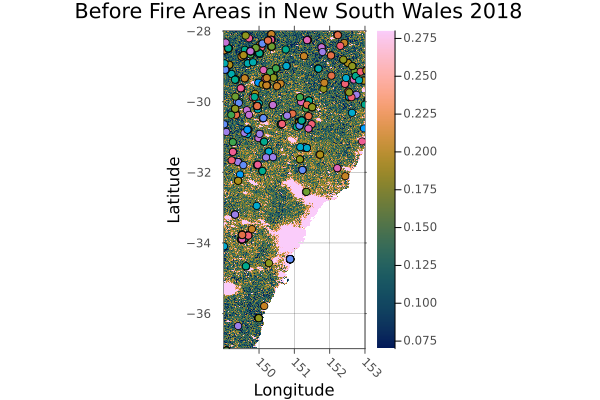

In [26]:
#making a plot of the NTL data and laying the fire shapefile ontop of it
reference_raster = winsorized_2018[nsw_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title = " Before Fire Areas in New South Wales 2018", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

# Add axis labels
xlabel!("Longitude")
ylabel!("Latitude")
#this is before the fires we are observing occur so the points on here are unrelated bushfires
no_fires = plot!(fire_cropped_2018.geometry)

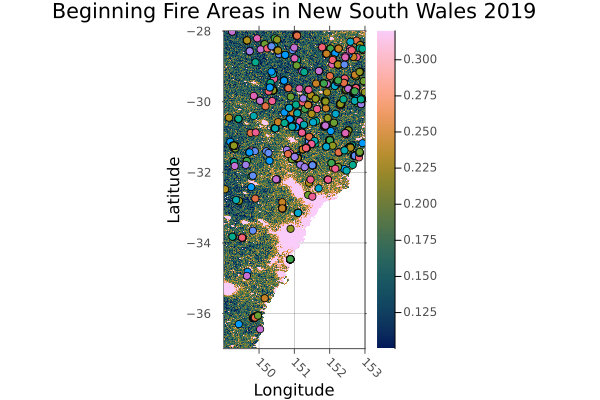

In [27]:
#same metholodgy as above but we do this now for the subsequent years
reference_raster = winsorized_2019[nsw_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title="Beginning Fire Areas in New South Wales 2019", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

# Add axis labels
xlabel!("Longitude")
ylabel!("Latitude")
fireplot_start = plot!(Fire_cropped0619.geometry)

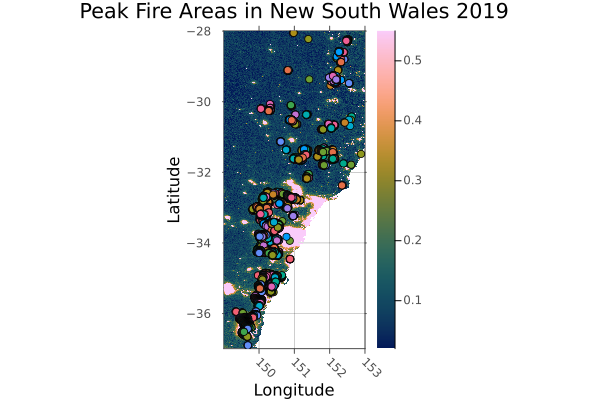

In [28]:
#same metholodgy as above
reference_raster = winsorized_2019pf[nsw_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title="Peak Fire Areas in New South Wales 2019", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

# Add axis labels
xlabel!("Longitude")
ylabel!("Latitude")
fireplot_peak = plot!(Fire_cropped1219.geometry)

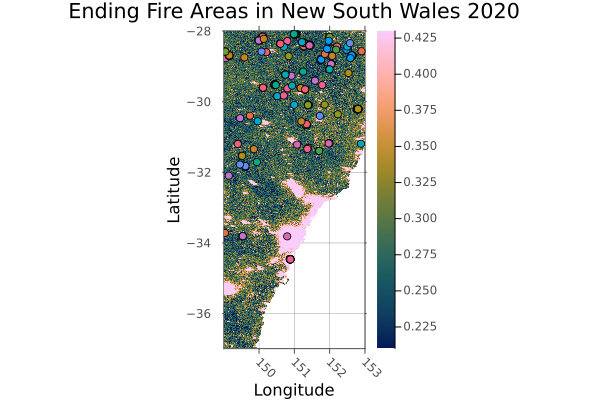

In [29]:
#same metholodgy as above
reference_raster = winsorized_2020[nsw_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title="Ending Fire Areas in New South Wales 2020", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

# Add axis labels
xlabel!("Longitude")
ylabel!("Latitude")
fireplot_end = plot!(Fire_cropped2020.geometry)

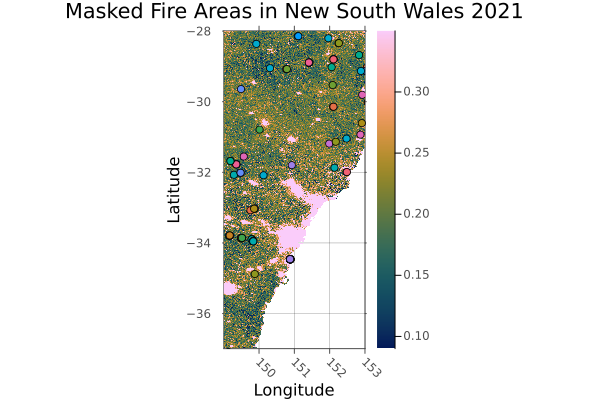

In [30]:
#same metholodgy as above
reference_raster = winsorized_2021[nsw_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title="Masked Fire Areas in New South Wales 2021", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

# Add axis labels
xlabel!("Longitude")
ylabel!("Latitude")
year_fires = plot!(fire_cropped_2021.geometry)

In [31]:
#summary statistics for NTL data from 2018-2023
#we want to see numerical changes in NTL intensity over time
#using NSW_bounds created in the earlier lines
mean_intensity_2018 = mean(winsorized_2018[nsw_bounds...])

0.15432822639926536

In [32]:
mean_intensity_2019 = mean(winsorized_2019[nsw_bounds...])

0.18425919374112731

In [33]:
mean_intensity_2019pf = mean(winsorized_2019pf[nsw_bounds...])

0.1372941367092859

In [34]:
mean_intensity_2020 = mean(winsorized_2020[nsw_bounds...])

0.2883598212797565

In [33]:
mean_intensity_2021 = mean(winsorized_2021[nsw_bounds...])

0.20478461753139168

In [34]:
mean_intensity_2023 = mean(winsorized_2023[nsw_bounds...])

0.22130492400122248

In [38]:
mean_intensity_2025 = mean(winsorized_2025[nsw_bounds...])

0.3337940173960561

In [35]:
#count number of fire events in each year
#2018 is going to be the baseline or control year for the analysis
#number of fire events for each month focused in accordance with the year
fire_count_2018 = nrow(fire_cropped_2018)

476

In [36]:
fire_count_2019 = length(Fire_cropped0619.geometry)

651

In [37]:
fire_count_2019pf = length(Fire_cropped1219.geometry)

10658

In [38]:
fire_count_2020 = length(Fire_cropped2020.geometry)

294

In [39]:
fire_count_2021 = length(fire_cropped_2021.geometry)

142

In [39]:
#Use the above summary statitics to create a dataframe for regression analysis
data = DataFrame(
    Period = ["June 2018", "June 2019", "December 2019", "March 2020", "March 2021", "March 2023", "March 2025"],
    Year = [2018, 2019, 2019.5, 2020, 2021, 2023, 2025],  
    Mean_NTL = [0.15432822639926536, 0.18425919374112731, 0.1372941367092859, 
                0.2883598212797565, 0.20478461753139168, 0.22130492400122248, 0.23130492400122248],
    Fire_Count = [476, 651, 10658, 294, 142, 0, 0] 
)

#Accounting for differences relative to the 2018 control year
#Fire_Diff_2018 applies the Fire count minus 2018 count (476) to asses changes
#NTL_Diff_2018: NTL data from sequential years minus 2018 intensity (0.1543) asses changes
#Time is for the years after 2018
fire_diff18 = data.Fire_Count .- data.Fire_Count[1]
ntl_diff18 = data.Mean_NTL .- data.Mean_NTL[1]      
data.Time = data.Year .- 2018                               

7-element Vector{Float64}:
 0.0
 1.0
 1.5
 2.0
 3.0
 5.0
 7.0

In [43]:
#Multiple Linear Regression formula for coefficients table
regression = lm(@formula(Mean_NTL ~ Fire_Count + Time), data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Mean_NTL ~ 1 + Fire_Count + Time

Coefficients:
──────────────────────────────────────────────────────────────────────────────
                   Coef.  Std. Error      t  Pr(>|t|)    Lower 95%   Upper 95%
──────────────────────────────────────────────────────────────────────────────
(Intercept)   0.195726    0.0315162    6.21    0.0034   0.108223    0.283229
Fire_Count   -6.46823e-6  4.99596e-6  -1.29    0.2651  -2.03392e-5  7.40277e-6
Time          0.00669754  0.00803845   0.83    0.4516  -0.0156208   0.0290159
──────────────────────────────────────────────────────────────────────────────

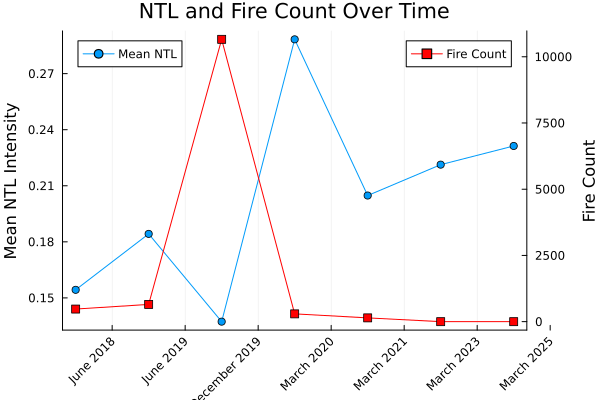

In [46]:
#Time series showing relationshiop between NTL and Fire Count
graph = plot(data.Period, data.Mean_NTL, marker=:circle, label="Mean NTL", 
          ylabel="Mean NTL Intensity", title="NTL and Fire Count Over Time", 
          xticks=(1:nrow(data), data.Period), xrotation=45, legend=:topleft)
plot!(twinx(), data.Period, data.Fire_Count, marker=:square, color=:red, 
      label="Fire Count", ylabel="Fire Count", legend=:topright)

New Segment of Analysis

In [48]:
# center points of regions in New South Wales and main city of sydney
#using to compare national park distance from sydney
sydney_center = ArchGDAL.createpoint(151.2093, -33.8688)
blue_mountains_center = ArchGDAL.createpoint(150.35, -33.55)
southeast_center = ArchGDAL.createpoint(149.72, -36.89)
washpool_center = ArchGDAL.createpoint(152.32, -29.62)

Geometry: POINT (152.32 -29.62)

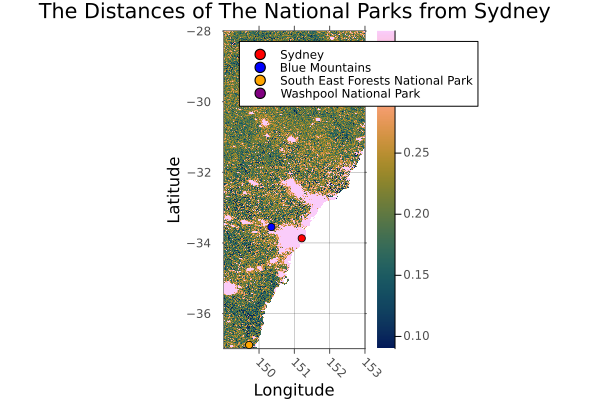

In [92]:
# using the same raster and bounds as we used earlier 
#this plot is just to show visually the distances of the parks from sydney
#backround doesn't really matter
reference_raster = winsorized_2021[nsw_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title="The Distances of The National Parks from Sydney", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

# Add axis labels
xlabel!("Longitude")
ylabel!("Latitude")
#plotting the center points to visualize their poximity to eachother
sydney = plot!(sydney_center, marker=:circle, color=:red, label="Sydney")
blue_mountains = plot!(blue_mountains_center, marker=:circle, color=:blue, label="Blue Mountains")
southeastforests_park = plot!(southeast_center, marker=:circle, color=:orange, label="South East Forests National Park")
washpool_park = plot!(washpool_center, marker=:circle, color=:purple, label="Washpool National Park")


In [52]:
#create bounding boxes for the parks to see if we can then see changes in specific regions of NTL data overtime
#for individual assessments of areas and setting boundary to asses how they were affected by fires
sydney_bounds = (X(Rasters.Between(150.25, 151.4)), Y(Rasters.Between(-34.4, -33.5)))
blue_mountains_bounds = (X(Rasters.Between(149, 150.0)), Y(Rasters.Between(-34.0, -33.0)))
southeastforests_bounds = (X(Rasters.Between(147.5, 149.0)), Y(Rasters.Between(-38.0, -36.0)))
washpool_bounds = (X(Rasters.Between(152.0, 153.0)), Y(Rasters.Between(-30.0, -29.0)))

(↓ X Between((152.0, 153.0)), → Y Between((-30.0, -29.0)))

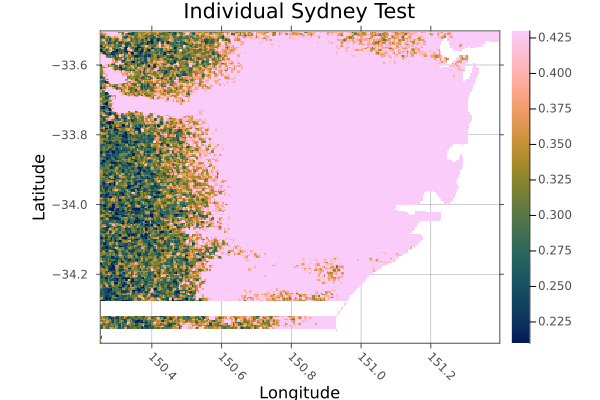

In [ ]:
#making sure the bounds are correct
#not using this plot for anything other than a test of the bounds
reference_raster = winsorized_2020[sydney_bounds...]
fire_masked = mask(reference_raster, with = shp.geometry[australia_index])
plot(fire_masked, title="Individual Sydney Test", label="Masked Fire Areas")
xlabel!("Longitude")
ylabel!("Latitude")

In [54]:
#want to use summary statistics to see how the NTL data changes in these regions over time
#useful for potential recovery analysis
#begin with sydney
mean_intensity_2018 = mean(winsorized_2018[sydney_bounds...])
mean_intensity_2019 = mean(winsorized_2019[sydney_bounds...])
mean_intensity_2019pf = mean(winsorized_2019pf[sydney_bounds...])
mean_intensity_2020 = mean(winsorized_2020[sydney_bounds...])
mean_intensity_2021 = mean(winsorized_2021[sydney_bounds...])
mean_intensity_2023 = mean(winsorized_2023[sydney_bounds...])
mean_intensity_2025 = mean(winsorized_2025[sydney_bounds...])
#print the results for sydney
println("Sydney NTL Intensity (2018-2023):")
println("2018: ", mean_intensity_2018)
println("2019: ", mean_intensity_2019)
println("2019 Peak: ", mean_intensity_2019pf)
println("2020: ", mean_intensity_2020)
println("2021: ", mean_intensity_2021)
println("2023: ", mean_intensity_2023)
println("2025: ", mean_intensity_2025)


Sydney NTL Intensity (2018-2023):
2018: 0.24815729458601732
2019: 0.2843364016855998
2019 Peak: 0.4375741288204841
2020: 0.3890060085703404
2021: 0.302141561510573
2023: 0.33199932683358485
2025: 0.46798951347484147


In [55]:
#want to use summary statistics to see how the NTL data changes in these regions over time
#useful for potential recovery analysis
#blue mountains
mean_intensity_2018 = mean(winsorized_2018[blue_mountains_bounds...])
mean_intensity_2019 = mean(winsorized_2019[blue_mountains_bounds...])
mean_intensity_2019pf = mean(winsorized_2019pf[blue_mountains_bounds...])
mean_intensity_2020 = mean(winsorized_2020[blue_mountains_bounds...])
mean_intensity_2021 = mean(winsorized_2021[blue_mountains_bounds...])
mean_intensity_2023 = mean(winsorized_2023[blue_mountains_bounds...])
mean_intensity_2025 = mean(winsorized_2025[blue_mountains_bounds...])
#print the results for blue mountains
println("Blue Mountains NTL Intensity (2018-2023):")
println("2018: ", mean_intensity_2018)
println("2019: ", mean_intensity_2019)
println("2019 Peak: ", mean_intensity_2019pf)
println("2020: ", mean_intensity_2020)
println("2021: ", mean_intensity_2021)
println("2023: ", mean_intensity_2023)
println("2025: ", mean_intensity_2025)


Blue Mountains NTL Intensity (2018-2023):
2018: 0.17770837376776288
2019: 0.17921692542685458
2019 Peak: 0.14712470076375336
2020: 0.30043994439443145
2021: 0.21708793584993996
2023: 0.24147598975973114
2025: 0.37055951452627145


In [56]:
#want to use summary statistics to see how the NTL data changes in these regions over time
#useful for potential recovery analysis
#southeast forest
mean_intensity_2018 = mean(winsorized_2018[southeastforests_bounds...])
mean_intensity_2019 = mean(winsorized_2019[southeastforests_bounds...])
mean_intensity_2019pf = mean(winsorized_2019pf[southeastforests_bounds...])
mean_intensity_2020 = mean(winsorized_2020[southeastforests_bounds...])
mean_intensity_2021 = mean(winsorized_2021[southeastforests_bounds...])
mean_intensity_2023 = mean(winsorized_2023[southeastforests_bounds...])
mean_intensity_2025 = mean(winsorized_2025[southeastforests_bounds...])
#print the results for southeast forest
println("Southeast Forest NTL Intensity (2018-2023):")
println("2018: ", mean_intensity_2018)
println("2019: ", mean_intensity_2019)
println("2019 Peak: ", mean_intensity_2019pf)
println("2020: ", mean_intensity_2020)
println("2021: ", mean_intensity_2021)
println("2023: ", mean_intensity_2023)
println("2025: ", mean_intensity_2025)

Southeast Forest NTL Intensity (2018-2023):
2018: 0.148618021548938
2019: 0.18364892083753614
2019 Peak: 0.12354685670328258
2020: 0.2717476934121521
2021: 0.20111412610949006
2023: 0.23866353893903614
2025: 0.3284506586136177


In [57]:
#want to use summary statistics to see how the NTL data changes in these regions over time
#useful for potential recovery analysis
#southeast forest
mean_intensity_2018 = mean(winsorized_2018[washpool_bounds...])
mean_intensity_2019 = mean(winsorized_2019[washpool_bounds...])
mean_intensity_2019pf = mean(winsorized_2019pf[washpool_bounds...])
mean_intensity_2020 = mean(winsorized_2020[washpool_bounds...])
mean_intensity_2021 = mean(winsorized_2021[washpool_bounds...])
mean_intensity_2023 = mean(winsorized_2023[washpool_bounds...])
mean_intensity_2025 = mean(winsorized_2025[washpool_bounds...])
#print the results for southeast forest
println("washpool Forest NTL Intensity (2018-2023):")
println("2018: ", mean_intensity_2018)
println("2019: ", mean_intensity_2019)
println("2019 Peak: ", mean_intensity_2019pf)
println("2020: ", mean_intensity_2020)
println("2021: ", mean_intensity_2021)
println("2023: ", mean_intensity_2023)
println("2025: ", mean_intensity_2025)

washpool Forest NTL Intensity (2018-2023):
2018: 0.14008700844664856
2019: 0.16822079476153315
2019 Peak: 0.1466809059924413
2020: 0.2797018612687577
2021: 0.20164300331141888
2023: 0.20965564319085317
2025: 0.301393008616274


In [87]:

#distances of sydney from sydney, 
#distance blue mountains, south east forest and washpool from sydney in kilometers
distances = [0.0, 81.47, 368.92, 468.22]

#Link location to mean NTL data to create DataFrame with NTL data and distances
#arrange output by year and in order of region
averages = DataFrame(
    location = ["Sydney", "Blue Mountains", "South East Forest", "Washpool"],
    Mean_NTL_2018 = [0.24815729458601732, 0.17770837376776288, 0.148618021548938, 0.14008700844664856],
    Mean_NTL_2019 = [0.2843364016855998, 0.17921692542685458, 0.18364892083753614, 0.16822079476153315],
    Mean_NTL_2019pf = [0.4375741288204841, 0.14712470076375336, 0.12354685670328258, 0.1466809059924413],
    Mean_NTL_2020 = [0.3890060085703404, 0.30043994439443145, 0.2717476934121521, 0.2797018612687577],
    Mean_NTL_2021 = [0.302141561510573, 0.21708793584993996, 0.20111412610949006, 0.20164300331141888],
    Mean_NTL_2023 = [0.33199932683358485, 0.24147598975973114, 0.23866353893903614, 0.20965564319085317],
    Mean_NTL_2025 = [0.46798951347484147, 0.37055951452627145, 0.3284506586136177, 0.301393008616274],
    Distance_to_Sydney = distances
)

Row,location,Mean_NTL_2018,Mean_NTL_2019,Mean_NTL_2019pf,Mean_NTL_2020,Mean_NTL_2021,Mean_NTL_2023,Mean_NTL_2025,Distance_to_Sydney
,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Sydney,0.248157,0.284336,0.437574,0.389006,0.302142,0.331999,0.46799,0.0
2,Blue Mountains,0.177708,0.179217,0.147125,0.30044,0.217088,0.241476,0.37056,81.47
3,South East Forest,0.148618,0.183649,0.123547,0.271748,0.201114,0.238664,0.328451,368.92
4,Washpool,0.140087,0.168221,0.146681,0.279702,0.201643,0.209656,0.301393,468.22


In [134]:
#calculate recovery speed for each region
#sydney
sydney_recovery_speed = (averages.Mean_NTL_2025[1] - averages.Mean_NTL_2020[1]) / 6
#blue mountains
blue_mountains_recovery_speed = (averages.Mean_NTL_2025[2] - averages.Mean_NTL_2020[2]) / 6
#southeast forests
southeast_forests_recovery_speed = (averages.Mean_NTL_2025[3] - averages.Mean_NTL_2020[3]) / 6
#washpool
washpool_recovery_speed = (averages.Mean_NTL_2025[4] - averages.Mean_NTL_2020[4]) / 6


0.0036151912245860527

In [135]:
# Create a DataFrame to summarize the recovery speeds
recovery_speeds = DataFrame(
    Location = ["Sydney", "Blue Mountains", "South East Forests", "Washpool"],
    Recovery_Speed = [sydney_recovery_speed, blue_mountains_recovery_speed, southeast_forests_recovery_speed, washpool_recovery_speed])

Row,Location,Recovery_Speed
,String,Float64
1,Sydney,0.0131639
2,Blue Mountains,0.0116866
3,South East Forests,0.00945049
4,Washpool,0.00361519


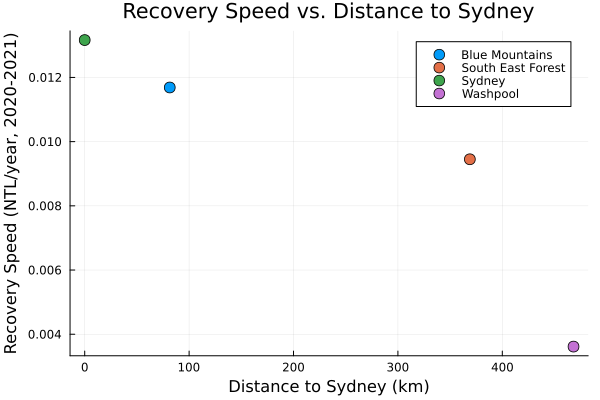

In [136]:
#Scatter plot to visualize recovery speed vs. distance to Sydney
p = scatter(averages.Distance_to_Sydney, recovery_speeds.Recovery_Speed,
            group=averages.location,
            xlabel="Distance to Sydney (km)",
            ylabel="Recovery Speed (NTL/year, 2020-2021)",
            title="Recovery Speed vs. Distance to Sydney",
            markersize=6, legend=:topright)
plot(p)
